In [1]:
import json
import os
import random

from PIL import Image
import torch.nn as nn
import torchvision.transforms as T
import numpy as np

import matplotlib.pyplot as plt

from utils import load_model_params
from datasets import BasicDataset
from models import *
from patchgan import PatchGAN

training_directory = "C:\\Users\\jsumm\\Documents\\CGVI Non OneDrive\\Project Stuff\\Datasets\\split_dataset"
val_db = BasicDataset(os.path.join(training_directory, "val"), jitter=False, mirror=False)
print("Validation set: %d images" % len(val_db))
train_db = BasicDataset(os.path.join(training_directory, "train"), jitter=True, mirror=True)
print("Training set: %d images" % len(train_db))


Validation set: 62 images
Training set: 1550 images


In [2]:
output_directory = "C:\\Users\\jsumm\\Documents\\CGVI Non OneDrive\\Project Stuff\\Saved Models\\JUSTGIVEMEB-new"
fp = open(os.path.join(output_directory, "training_options.json"))
training_options = json.load(fp)
display(training_options)

{'GAN_loss': 'vanilla',
 'batch_print_freq': 4,
 'batch_size': 25,
 'dataset_dir': './datasets/split_dataset',
 'decay_epoch': 100,
 'init_mode': 'normal',
 'lambda_gp': 10.0,
 'lambda_l1': 50.0,
 'lr': 0.0002,
 'model': 'customB',
 'num_disc_iterations': 5,
 'num_epochs': 200,
 'num_workers': 2,
 'save_loc': './trained_models/JUSTGIVEMEB-new',
 'use_batch_norm': False,
 'use_gpu': True}

In [3]:
if training_options["use_batch_norm"]:
    norm_layer = nn.BatchNorm2d
else:
    norm_layer = nn.InstanceNorm2d
if training_options["model"] == "pix2pix":
    generator = Pix2PixGenerator(norm_layer=norm_layer)
elif training_options["model"] == "cyclegan":
    generator = CycleGANGenerator(norm_layer=norm_layer)
elif training_options["model"] == "customA":
    generator = CustomGeneratorA(norm_layer=norm_layer)
elif training_options["model"] == "customB":
    generator = CustomGeneratorB(norm_layer=norm_layer)
else:
    raise Exception("The model %s is not recognised" % opt.model)
    
load_model_params(generator, os.path.join(output_directory, "generator.pth"))

# Samples from validation set

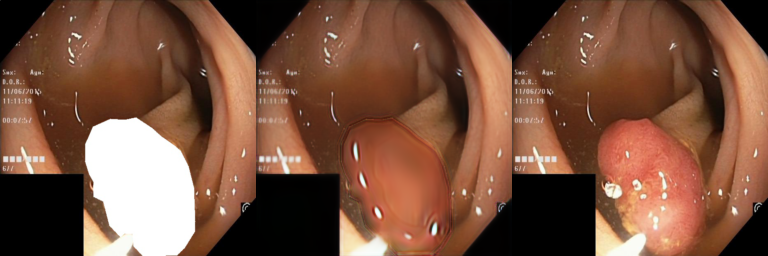

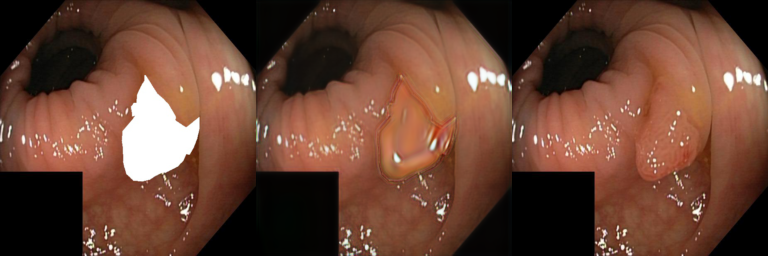

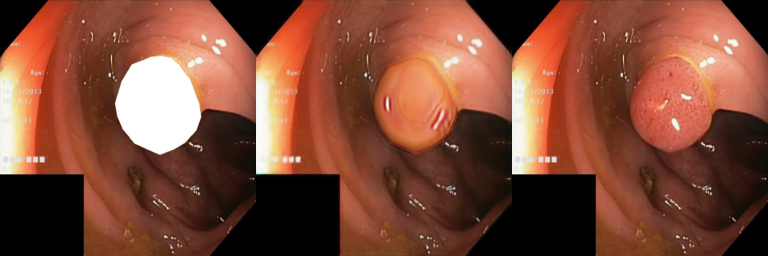

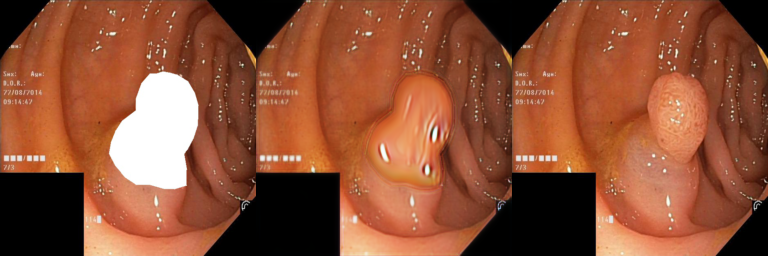

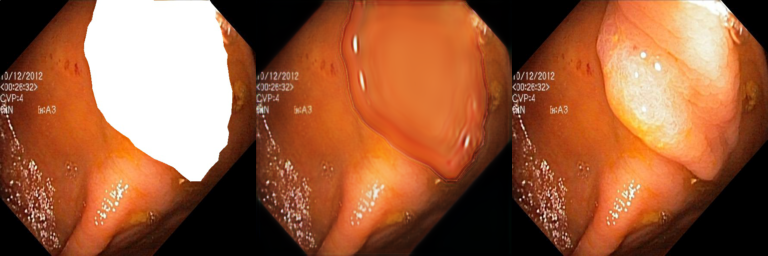

...

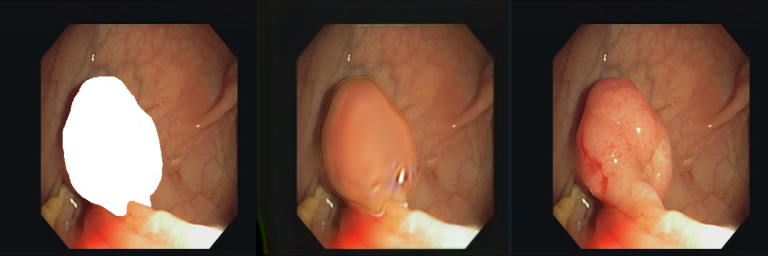

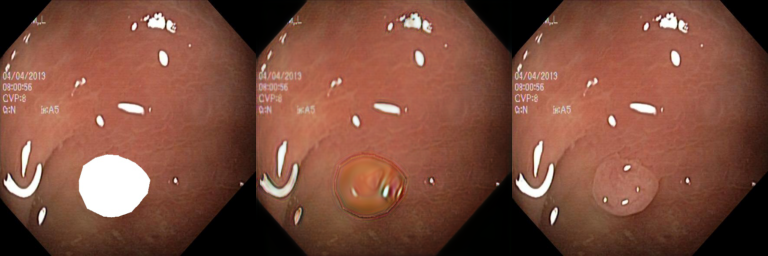

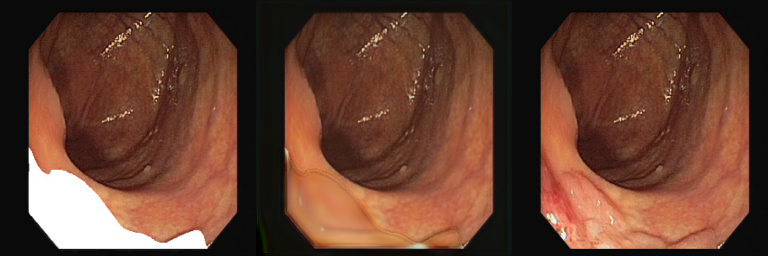

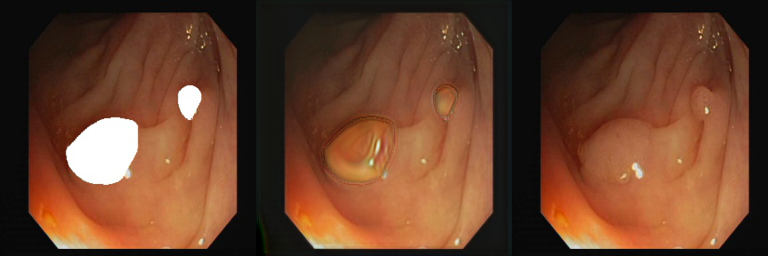

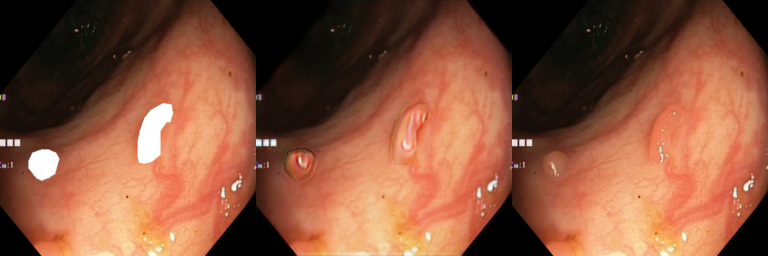

In [43]:
num_samples = 15
indices = [i for i in range(len(val_db))]
random.shuffle(indices)
indices = indices[:num_samples]
for idx in indices:
    composite, polyp = val_db[idx]
    generated = generator(composite[None, ...])
    combined = torch.cat([composite, generated[0, ...], polyp], dim=2)
    img = T.ToPILImage()((combined+1)/2) # de-normalize ([-1,1] -> [0,1])
    display(img)

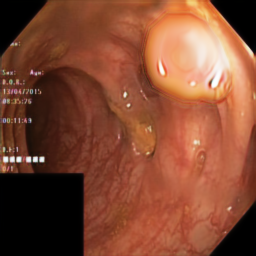

In [14]:
# Creating single image for a close up in the dissertation (show off those beautiful artefacts :) )
composite, polyp = val_db[random.randrange(len(val_db))]
generated = generator(composite[None, ...])[0, ...]
img = T.ToPILImage()((generated+1)/2) # de-normalize ([-1,1] -> [0,1])
display(img)

# Samples from training set (check overfitting?)

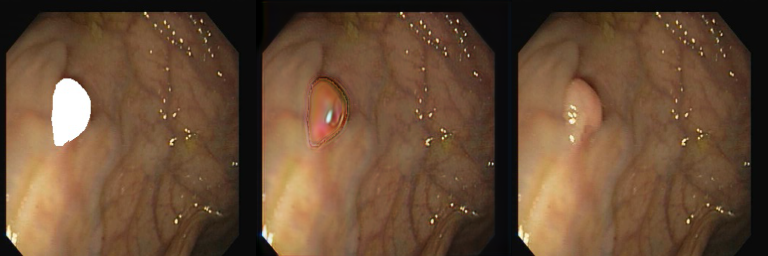

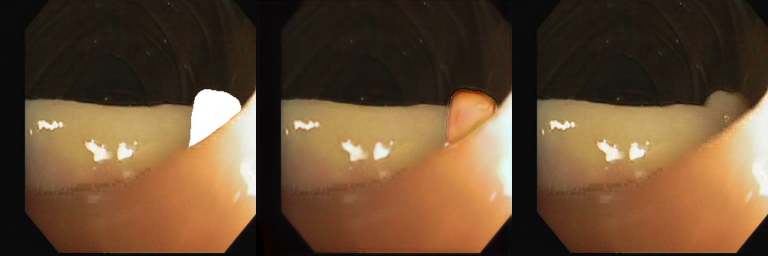

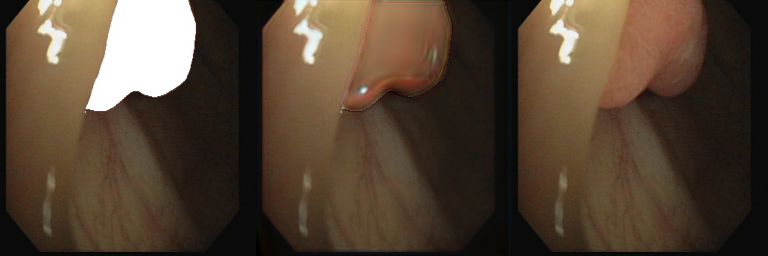

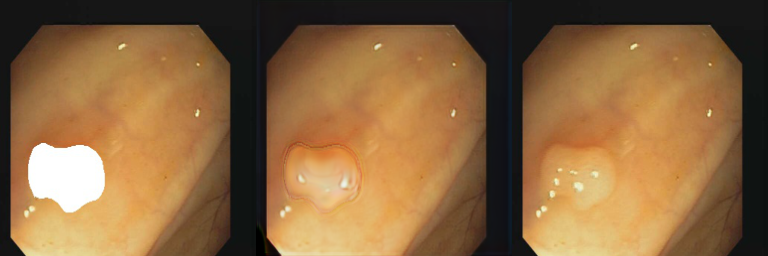

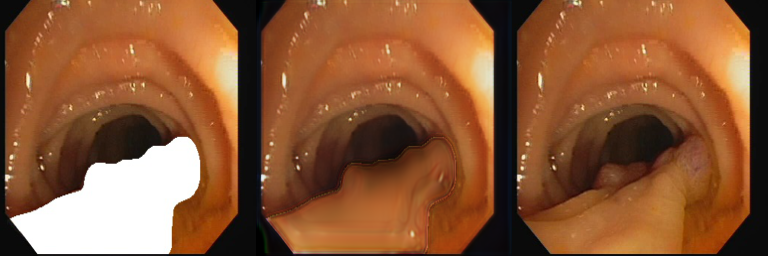

...

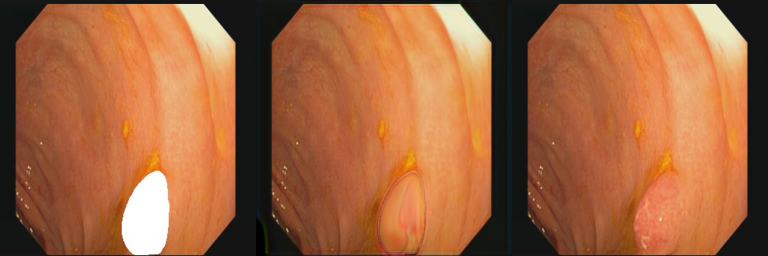

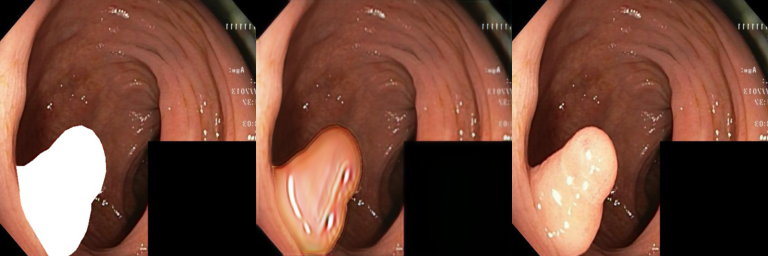

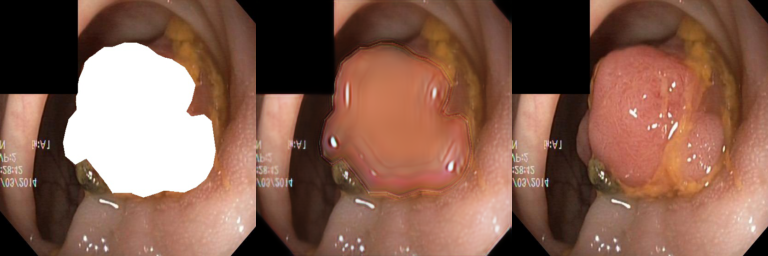

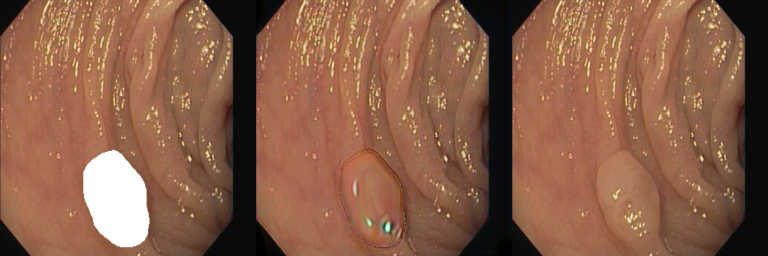

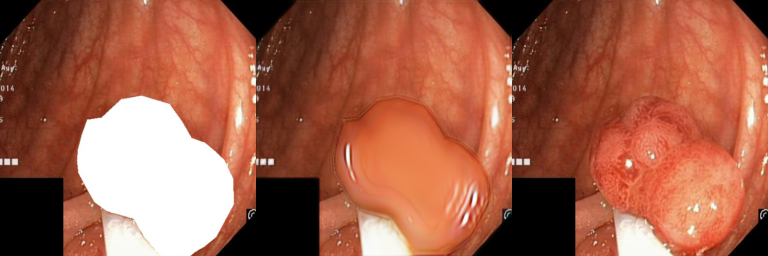

In [44]:
num_samples = 15
indices = [i for i in range(len(train_db))]
random.shuffle(indices)
indices = indices[:num_samples]
for idx in indices:
    composite, polyp = train_db[idx]
    generated = generator(composite[None, ...])
    combined = torch.cat([composite, generated[0, ...], polyp], dim=2)
    img = T.ToPILImage()((combined+1)/2) # de-normalize ([-1,1] -> [0,1])
    display(img)

# Training loss plots

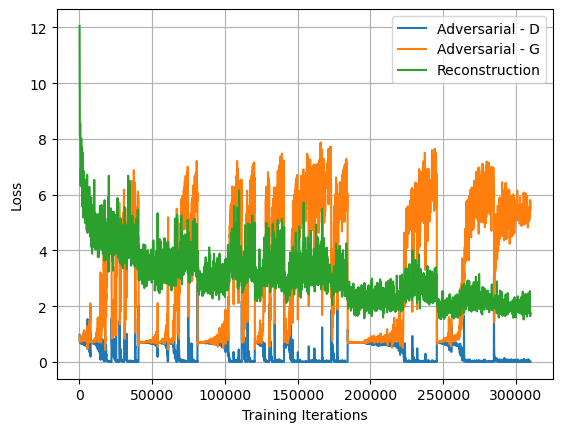

In [59]:
loss_history = np.load(os.path.join(output_directory, "loss_history.npy"))
iterations = loss_history[:, 0] * training_options["batch_size"]
loss_Ds = loss_history[:, 1]
GAN_loss_Gs = loss_history[:, 2]
recon_losses = loss_history[:, 3]

plt.plot(iterations, loss_Ds)
plt.plot(iterations, GAN_loss_Gs)
plt.plot(iterations, recon_losses)
plt.grid()
plt.ylabel("Loss")
plt.xlabel("Training Iterations")
plt.legend(["Adversarial - D", "Adversarial - G", "Reconstruction"])
plt.show()

# Visualise discriminator output (because I'm desperate)

In [8]:
discriminator = PatchGAN(norm_layer=norm_layer)
load_model_params(discriminator, os.path.join(output_directory, "discriminator.pth"))

real


0.6938634514808655

5.414931297302246

mean: 3.146272


-9.957368850708008

-3.7005743980407715

mean: -6.017624


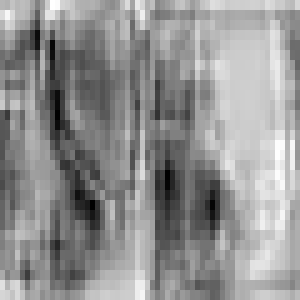

real


3.865396738052368

10.204036712646484

mean: 6.236676


-8.948037147521973

-3.4755282402038574

mean: -5.911133


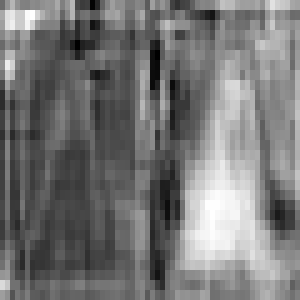

real


3.358211040496826

9.680740356445312

mean: 6.034276


-7.457544326782227

-2.4848339557647705

mean: -5.259695


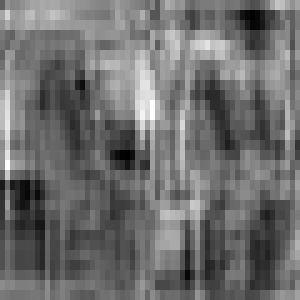

real


2.952136754989624

8.132547378540039

mean: 5.843568


-8.014006614685059

-3.54403018951416

mean: -5.353787


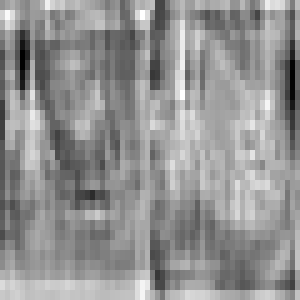

real


3.082056760787964

7.749610424041748

mean: 5.123394


-9.119873046875

-4.213839530944824

mean: -6.825234


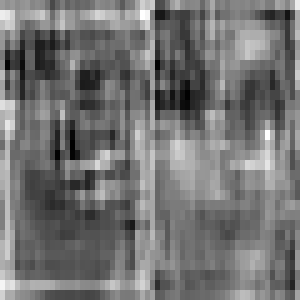

In [9]:
num_samples = 5
indices = [i for i in range(len(val_db))]
random.shuffle(indices)
indices = indices[:num_samples]
for idx in indices:
    composite, polyp = val_db[idx]
    generated = generator(composite[None, ...])
    pred_real = discriminator(composite[None, ...], polyp[None, ...])
    pred_fake = discriminator(composite[None, ...], generated)
    # normalise the predictions
    print("real")
    display(torch.min(pred_real).item(), torch.max(pred_real).item())
    print("mean: %f" % (pred_real.mean().item()))
    display(torch.min(pred_fake).item(), torch.max(pred_fake).item())
    print("mean: %f" % (pred_fake.mean().item()))
    pred_real = (pred_real - torch.min(pred_real))/(torch.max(pred_real) - torch.min(pred_real))
    pred_fake = (pred_fake - torch.min(pred_fake))/(torch.max(pred_fake) - torch.min(pred_fake))
    combined = torch.cat((pred_real[0, ...], pred_fake[0, ...]), dim=2)
    img = T.ToPILImage()(combined)
    display(img.resize((300,300), Image.Resampling.NEAREST))

MISC (creating figure for showing comparisons of generators):

In [28]:
#pix2pix_baseline_G = generator

In [35]:
#cyclegan_baseline_G = generator

In [45]:
#proposed_G = generator

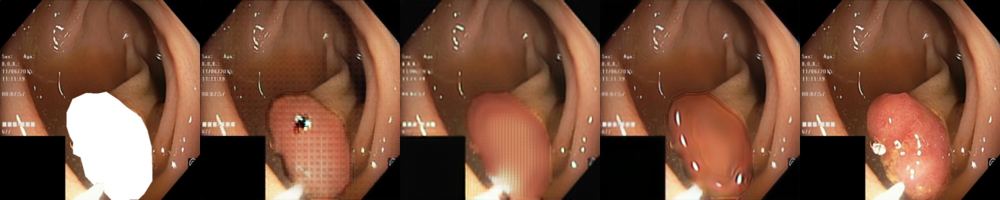

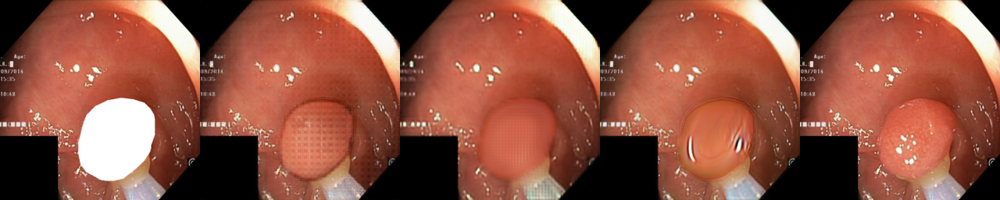

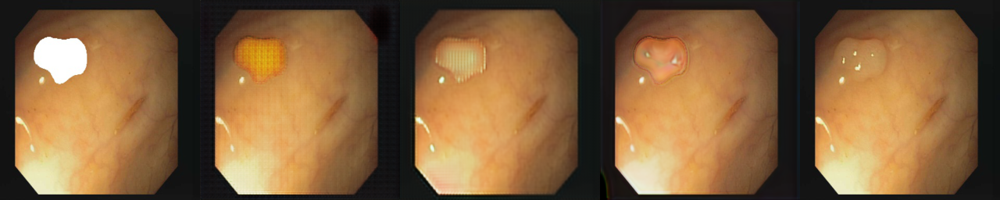

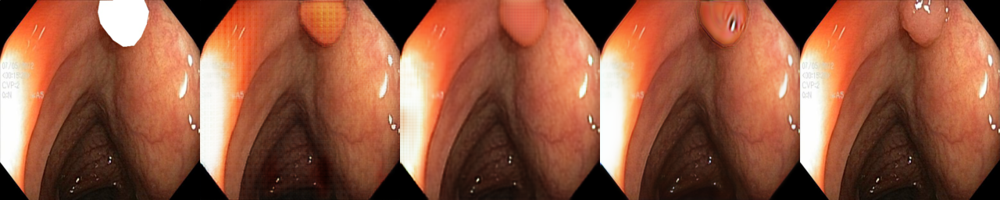

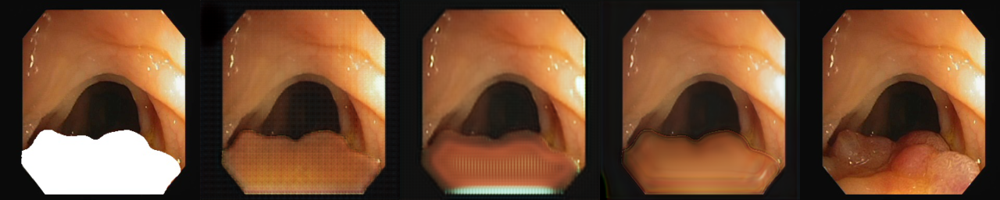

...

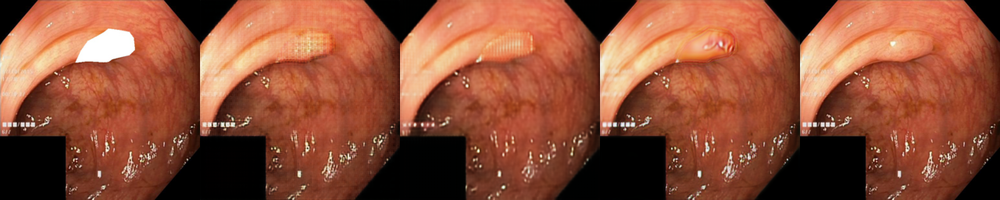

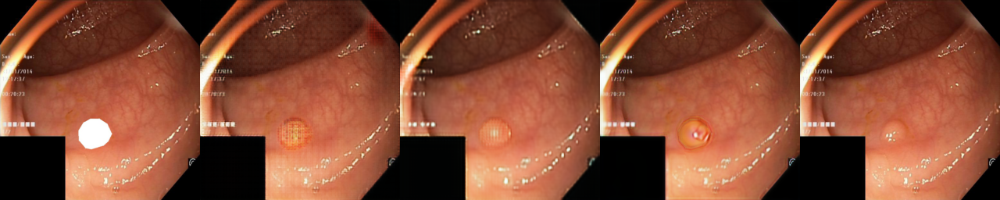

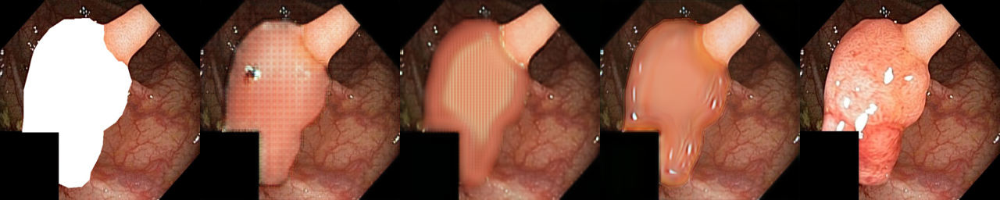

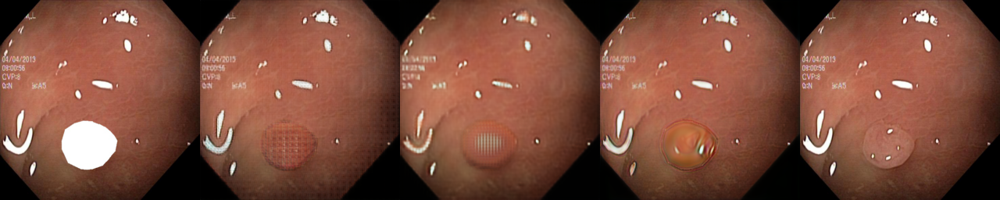

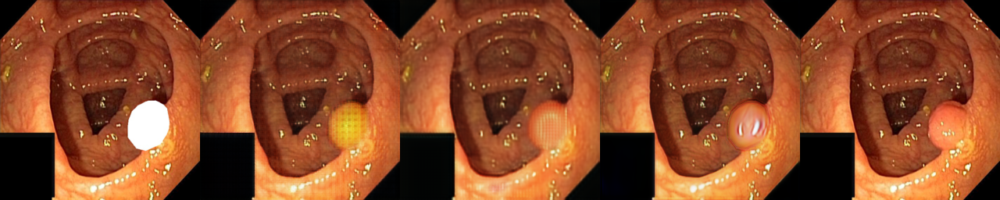

In [49]:
num_samples = 15
indices = [i for i in range(len(val_db))]
random.shuffle(indices)
indices = indices[:num_samples]
for idx in indices:
    composite, polyp = val_db[idx]
    pix2pix_image = pix2pix_baseline_G(composite[None, ...])
    cyclegan_image = cyclegan_baseline_G(composite[None, ...])
    custom_image = proposed_G(composite[None, ...])
    
    combined = torch.cat([composite, pix2pix_image[0, ...], cyclegan_image[0, ...], custom_image[0, ...], polyp], dim=2)
    img = T.ToPILImage()((combined+1)/2) # de-normalize ([-1,1] -> [0,1])
    display(img)

Another misc: creating the plot of AP values obtained in the polyp instance segmentation task (from polyp_instance_segmentation_results.txt):

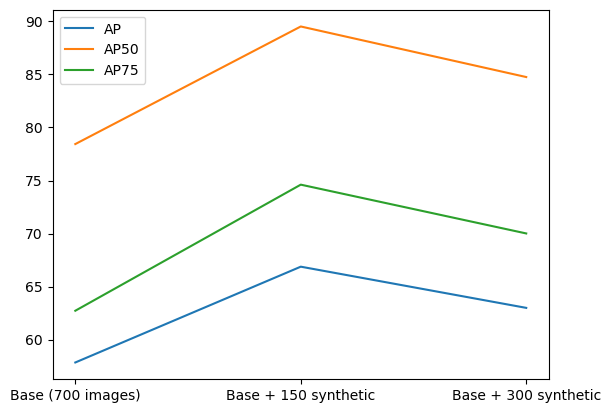

In [55]:
APs = [57.84040765683876, 66.87468262265409, 62.990209239234865]
AP50s = [78.43687005267279, 89.52593062057616, 84.75718608286444]
AP75s = [62.719755761270605, 74.6098447501358, 70.00842906348296]
APms = [37.605142982487955, 49.68564093876788, 57.49018767079011]
names = ["Base (700 images)", "Base + 150 synthetic", "Base + 300 synthetic"]

plt.plot(names, APs)
plt.plot(names, AP50s)
plt.plot(names, AP75s)
plt.legend(["AP", "AP50", "AP75"])
plt.show()